# Visualize the Landsat scenes

In [24]:
ID_init = 'LC08_L2SP_141054_20201207_20210313_02_T1'

In [25]:
import tifffile as tiff
import numpy as np
import matplotlib.pyplot as plt

def get_RGB(ID):

    # Load Blue (B2), Green (B3) and Red (B4) bands
    B2 = tiff.imread('{}/{}_SR_B2.TIF'.format(ID, ID))
    B3 = tiff.imread('{}/{}_SR_B3.TIF'.format(ID, ID))
    B4 = tiff.imread('{}/{}_SR_B4.TIF'.format(ID, ID))

    # Stack and scale bands
    RGB = np.dstack((B4, B3, B2))
    RGB = np.clip(RGB*0.0000275-0.2, 0, 1)

    # Clip to enhance contrast
    RGB = np.clip(RGB,0,0.3)/0.3

    return RGB

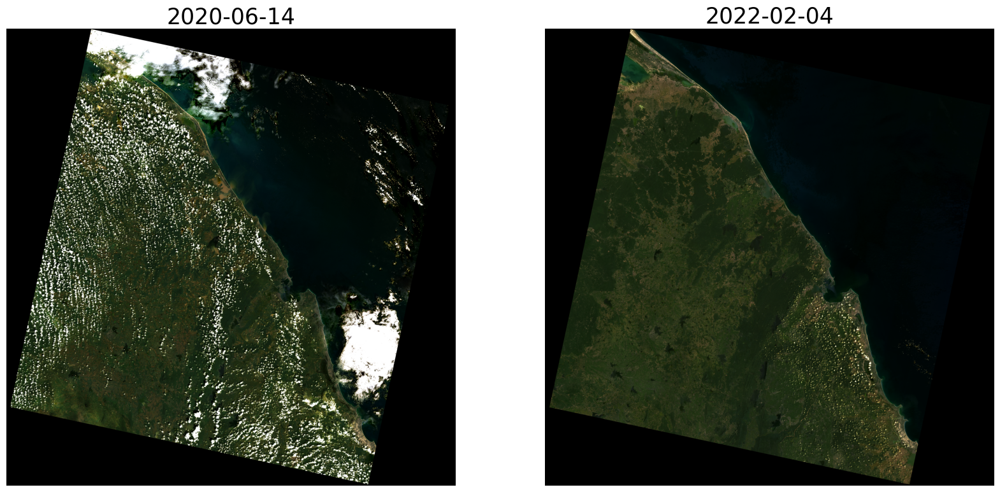

In [26]:
IDs = [ID_init,
       'LC09_L2SP_141054_20220204_20230429_02_T1']

fig, ax = plt.subplots(1,2,figsize=(20, 10))

# Cloudy image
ID = IDs[0]
RGB = get_RGB(ID)
ax[0].imshow(RGB)
ax[0].set_title('2020-06-14',size=25)
ax[0].set_axis_off()

# Non-cloudy image
ID = IDs[1]
RGB = get_RGB(ID)
ax[1].imshow(RGB)
ax[1].set_title('2022-02-04',size=25)
ax[1].set_axis_off()

# Get cloud masks

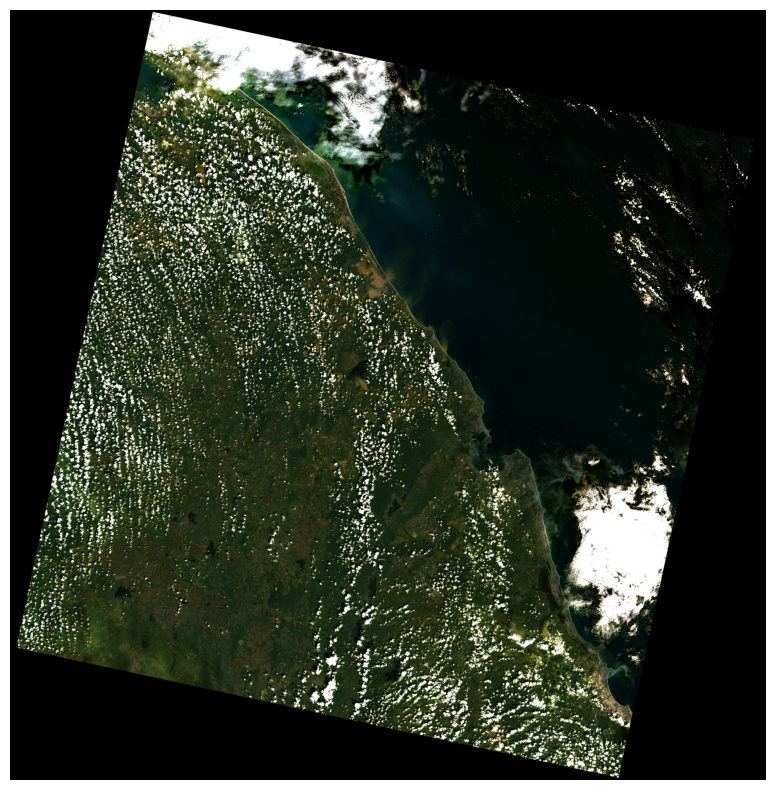

In [27]:
ID = ID_init
RGB = get_RGB(ID)

# Plot the RGB image
fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(RGB)
ax.set_axis_off()

# Provided by landsat

In [28]:
def get_mask(val,type='cloud'):
    
    """Get mask for a specific cover type"""

    # convert to binary
    bin_ = '{0:016b}'.format(val)

    # reverse string
    str_bin = str(bin_)[::-1]

    # get bit for cover type
    bits = {'cloud':3,'shadow':4,'dilated_cloud':1,'cirrus':2}
    bit = str_bin[bits[type]]

    if bit == '1':
        return 0 # cover
    else:
        return 1 # no cover

In [29]:
# QA band
QA = tiff.imread('{}/{}_QA_PIXEL.TIF'.format(ID, ID))
QA = np.array(QA)

# Get masks
cloud_mask = np.vectorize(get_mask)(QA,type='cloud')
shadow_mask = np.vectorize(get_mask)(QA,type='shadow')
dilated_cloud_mask = np.vectorize(get_mask)(QA,type='dilated_cloud')
cirrus_mask = np.vectorize(get_mask)(QA,type='cirrus')

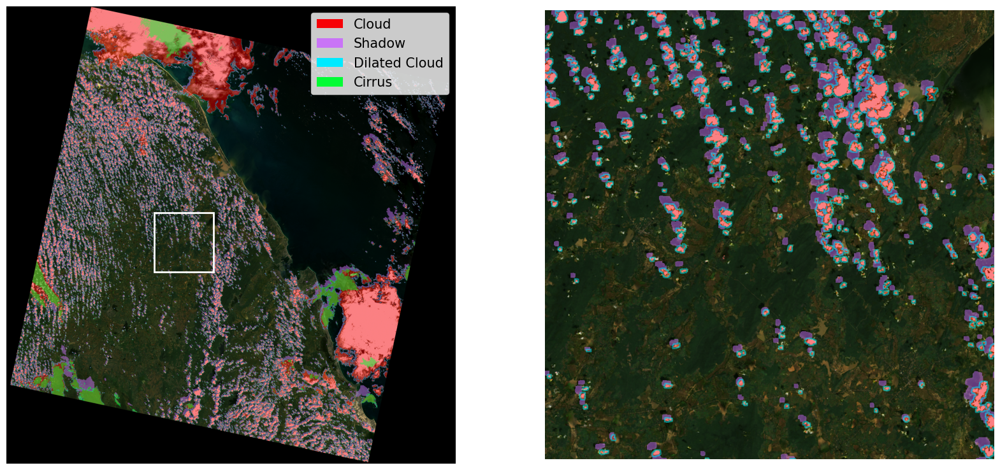

In [30]:
import cv2
import matplotlib as mpl

# Get RGB image 
ID = ID_init
RGB = get_RGB(ID)

# segmentation image
seg = RGB.copy()

# color for each cover type
colors = np.array([[247, 2, 7],
                    [201, 116, 247],
                    [0, 234, 255],
                    [3, 252, 53]])/255

masks = [cloud_mask, shadow_mask, dilated_cloud_mask, cirrus_mask]

for i,mask in enumerate(masks):

    # color for cover type
    temp = seg.copy()
    temp[mask == 0] = colors[i]

    # add to segmentation
    seg = cv2.addWeighted(seg, 0.5, temp, 0.5, 0)

fig, ax = plt.subplots(1,2,figsize=(20, 10))

ax[0].imshow(seg)

# add legend with colors for each cover type
legend_elements = [mpl.patches.Patch(facecolor=colors[0], label='Cloud'),
                     mpl.patches.Patch(facecolor=colors[1], label='Shadow'),
                        mpl.patches.Patch(facecolor=colors[2], label='Dilated Cloud'),
                        mpl.patches.Patch(facecolor=colors[3], label='Cirrus')]

ax[0].legend(handles=legend_elements, loc='upper right', fontsize=15)

# draw white rectangle around area of interest
h = 500
x,y = 3000,4000
rect = mpl.patches.Rectangle((x-h,y-h),h*2,h*2,linewidth=2,edgecolor='w',facecolor='none')
ax[0].add_patch(rect)

# crop area of interest
crop_seg =  seg[y-h:y+h,x-h:x+h,:]

ax[1].imshow(crop_seg)

ax[0].set_axis_off()
ax[1].set_axis_off()

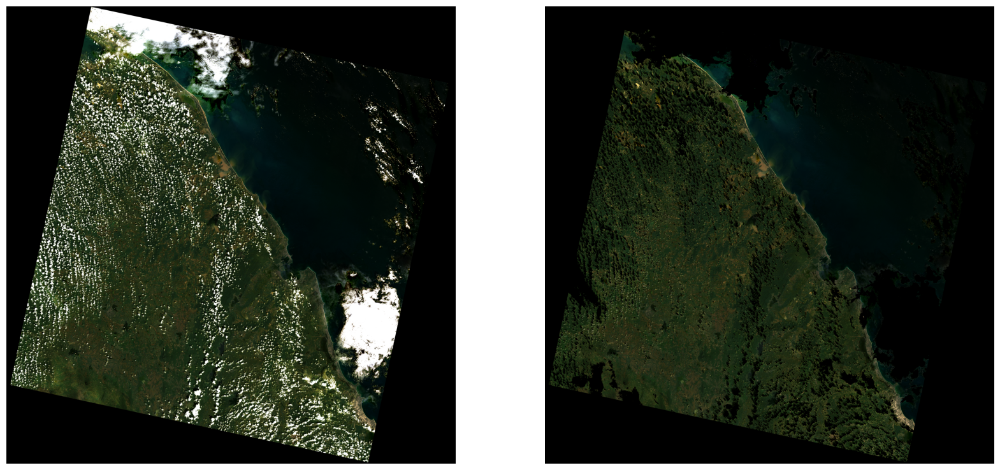

In [31]:
# Remove clouds
rm_clouds = RGB*cloud_mask[:, :, np.newaxis]

# Plot RGB and RGB without clouds
fig, ax = plt.subplots(1,2,figsize=(20, 10))

ax[0].imshow(RGB)
ax[1].imshow(rm_clouds)

ax[0].set_axis_off()
ax[1].set_axis_off()

In [32]:
# crop area of interest
cloud_aoi = cloud_mask[y-h:y+h,x-h:x+h]

# calculate percentage of cloud cover
per_cloud = np.average(1-cloud_aoi)*100
print('Percentage of clouds: {:.2f}%'.format(per_cloud))

Percentage of clouds: 4.09%


# Machine Learning Approach

In [33]:
def cloud_pred(B1,B4,B7):
    """Cloud prediction model"""

    pred = 2.16246741593412 -0.796409165054949*B4 + \
    0.971776520302587*np.sqrt(abs(0.028702220187686*B7*B1 + \
    0.971297779812314*np.sin(B1))) + \
    0.0235599298084993*np.floor(0.995223926146334*np.sqrt(abs(0.028702220187686*B7*B1 + 0.971297779812314*np.sin(B1)))+ \
    0.00477607385366598*abs(0.028702220187686*B7*B1 + \
    0.971297779812314*np.sin(B1))) - 0.180030905136552*np.cos(B4) + \
    0.0046635498889134*abs(0.028702220187686*B7*B1 + 0.971297779812314*np.sin(B1))

    cloud = np.where(pred > B7,0,1)

    return cloud

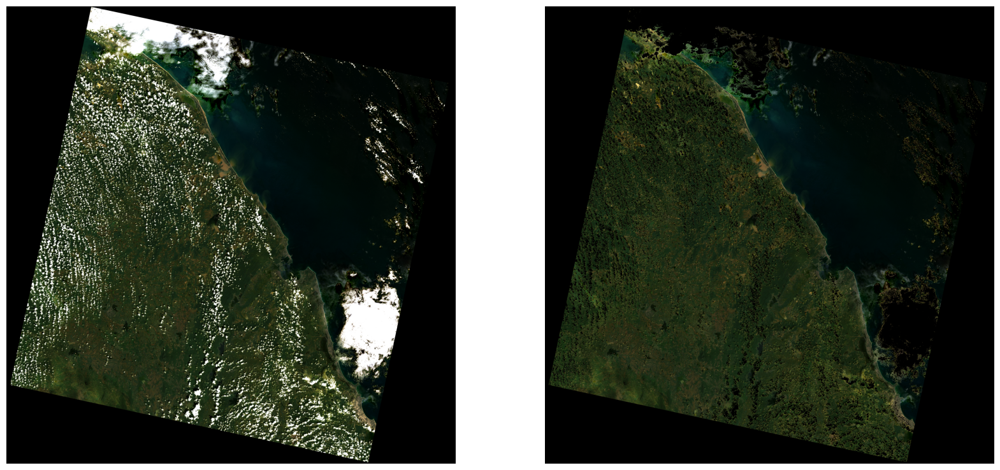

In [37]:
ID = ID_init

# Get Coastal Aerosol (B1), Red (B4) and Shortwave Infrared 2 (B7) bands
B1 = tiff.imread('{}/{}_SR_B1.TIF'.format(ID, ID))
B4 = tiff.imread('{}/{}_SR_B4.TIF'.format(ID, ID))
B7 = tiff.imread('{}/{}_SR_B7.TIF'.format(ID, ID))

# Get cloud mask
cloud_mask_2 = cloud_pred(B1,B4,B7)

# Remove clouds
rm_clouds = RGB*cloud_mask_2[:, :, np.newaxis]

# Plot RGB and RGB without clouds
fig, ax = plt.subplots(1,2,figsize=(20, 10))

ax[0].imshow(RGB)
ax[1].imshow(rm_clouds)

ax[0].set_axis_off()
ax[1].set_axis_off()

# Inpainting clouds

## Area of interest

In [38]:
# !pip install rasterio

In [40]:
import rasterio as rio

# IDs for cloudy and non-cloudy images
IDs = [ID_init,
       'LC09_L2SP_141054_20220204_20230429_02_T1']

# Get RGB
cloudy = get_RGB(IDs[0])
clear = get_RGB(IDs[1])

# Open red band with rasterio for geolocation
geo_cloudy = rio.open('{}/{}_SR_B4.TIF'.format(IDs[0], IDs[0]))
geo_clear = rio.open('{}/{}_SR_B4.TIF'.format(IDs[1], IDs[1]))

print("Bounding box of cloudy image: {}".format(geo_cloudy.bounds))
print("Bounding box of non-cloudy image: {}".format(geo_clear.bounds))

Bounding box of cloudy image: BoundingBox(left=382185.0, bottom=842685.0, right=609915.0, top=1074915.0)
Bounding box of non-cloudy image: BoundingBox(left=380385.0, bottom=842685.0, right=607815.0, top=1074615.0)


In [41]:
# get mask for cloudy image
mask = cloud_mask*shadow_mask*dilated_cloud_mask*cirrus_mask

# remove cloudy pixels
rm_mask = cloudy*mask[:, :, np.newaxis]

#crop area of interest
x,y,h = 3000,4000,500
crop_rm_mask = rm_mask[y-h:y+h,x-h:x+h]

In [42]:
# get UTM coordinates from cloudy image
utmx, utmy = geo_cloudy.xy(y,x)

# get pixels from clear image
y_,x_ = geo_clear.index(utmx, utmy)
print(x_,y_)

3060 3990


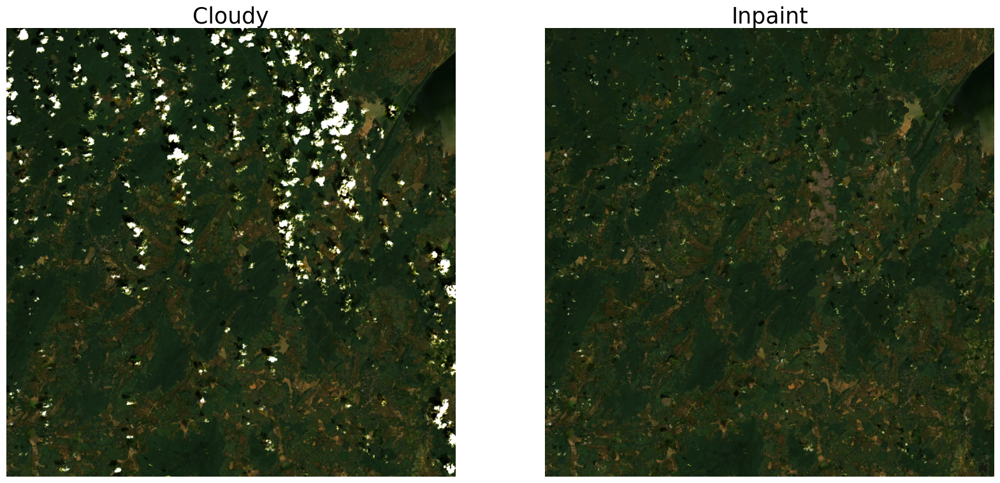

In [43]:
# crop clear image 
crop_clear = clear[y_-h:y_+h,x_-h:x_+h]

#get fill from clear image
crop_mask = mask[y-h:y+h,x-h:x+h]
fill = crop_clear*(1-crop_mask[:, :, np.newaxis])

#inpaint area of interest 
inpaint = crop_rm_mask + fill

#display
fig, ax = plt.subplots(1,2,figsize=(20, 10))

# Cloudy image
ax[0].imshow(cloudy[y-h:y+h,x-h:x+h])
ax[0].set_title('Cloudy',size=25)
ax[0].set_axis_off()

# Non-cloudy image
ax[1].imshow(inpaint)
ax[1].set_title('Inpaint',size=25)
ax[1].set_axis_off()

## The entire image

In [44]:
print("Bounding box of cloudy image: {}".format(geo_cloudy.bounds))
print("Bounding box of non-cloudy image: {}".format(geo_clear.bounds))

Bounding box of cloudy image: BoundingBox(left=382185.0, bottom=842685.0, right=609915.0, top=1074915.0)
Bounding box of non-cloudy image: BoundingBox(left=380385.0, bottom=842685.0, right=607815.0, top=1074615.0)


In [45]:
# get pixel coordinates of non-cloudy image
y,x = geo_clear.read(1).shape
clear_ul = (0,0) # upper left
clear_lr = (y,x) # lower right

print(clear_ul, clear_lr)

# get pixel coordinates of cloudy image corners
cloudy_bounds = geo_cloudy.bounds
new_clear_ul = geo_clear.index(cloudy_bounds.left,cloudy_bounds.top)
new_clear_lr = geo_clear.index(cloudy_bounds.right,cloudy_bounds.bottom)

print(new_clear_ul, new_clear_lr)

# calculate pixel adjustment 
top_adj = clear_ul[0] - new_clear_ul[0]
bottom_adj = new_clear_lr[0] - clear_lr[0]

left_adj = clear_ul[1] -  new_clear_ul[1]
right_adj = new_clear_lr[1] - clear_lr[1]

print(top_adj, bottom_adj, left_adj, right_adj)

(0, 0) (7731, 7581)
(-10, 60) (7731, 7651)
10 0 -60 70


In [46]:
def adjust_rgb(rgb, top_adj, bottom_adj, left_adj, right_adj):
    adj_rgb = rgb.copy()

    # Adding black pixels
    if top_adj > 0:
        add_top = np.zeros((top_adj, rgb.shape[1], 3))
        adj_rgb = np.vstack((add_top, adj_rgb))
    if bottom_adj > 0:
        add_bottom = np.zeros((bottom_adj, rgb.shape[1], 3))
        adj_rgb = np.vstack((adj_rgb, add_bottom))
    if left_adj > 0:
        add_left = np.zeros((adj_rgb.shape[0], left_adj, 3))
        adj_rgb = np.hstack((add_left, adj_rgb))
    if right_adj > 0:
        add_right = np.zeros((adj_rgb.shape[0], right_adj, 3))
        adj_rgb = np.hstack((adj_rgb, add_right))

    # Removing pixels
    if top_adj < 0:
        adj_rgb = adj_rgb[-top_adj:, :, :]
    if bottom_adj < 0:
        adj_rgb = adj_rgb[:bottom_adj, :, :]
    if left_adj < 0:
        adj_rgb = adj_rgb[:, -left_adj:, :]
    if right_adj < 0:
        adj_rgb = adj_rgb[:, :right_adj, :]

    return adj_rgb


In [47]:
# Get RGB images
cloudy_RGB = get_RGB(IDs[0])
clear_RGB = get_RGB(IDs[1])

# Adjust clear RGB image
clear_RGB_adj = adjust_rgb(clear_RGB,top_adj, bottom_adj, left_adj, right_adj)

# get mask for cloudy image
mask = cloud_mask*shadow_mask*dilated_cloud_mask*cirrus_mask

# remove cloudy pixels and fill with adjusted clear pixels
rm_mask = cloudy_RGB*mask[:, :, np.newaxis]
fill_mask = clear_RGB_adj*(1-mask[:, :, np.newaxis])
inpaint = rm_mask+fill_mask

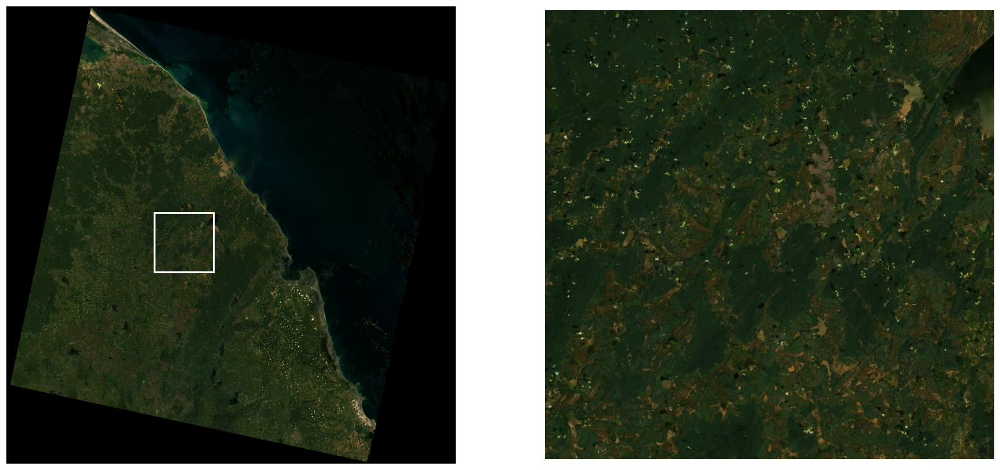

In [48]:
# Plot RGB and RGB without clouds
fig, ax = plt.subplots(1,2,figsize=(20, 10))
ax[0].imshow(inpaint)

# draw white rectangle around area of interest
h = 500
x,y = 3000,4000
rect = mpl.patches.Rectangle((x-h,y-h),h*2,h*2,linewidth=2,edgecolor='w',facecolor='none')
ax[0].add_patch(rect)

# crop area of interest
crop_inpaint =  inpaint[y-h:y+h,x-h:x+h,:]
ax[1].imshow(crop_inpaint)

ax[0].set_axis_off()
ax[1].set_axis_off()

Cropped image saved as ./Cropped_Images/20201207.tiff


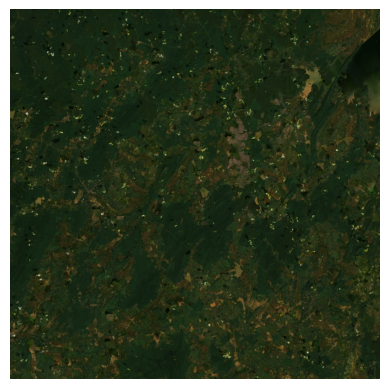

In [49]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpl_patches
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import numpy as np

# Set DPI for saving the image in maximum resolution
dpi = 350  
# Display and save the cropped image
plt.imshow(crop_inpaint)
plt.axis('off')

output_path = './Cropped_Images/20201207.tiff'
plt.savefig(output_path, bbox_inches='tight', pad_inches=0, format='tiff')
print(f"Cropped image saved as {output_path}")

In [50]:
# # Plot RGB and RGB without clouds
# fig, ax = plt.subplots(1,2,figsize=(20, 10))

# temp = inpaint.copy()
# temp[mask == 0] = [1,1,1]

# # add to segmentation
# temp = cv2.addWeighted(inpaint, 0.7, temp, 0.3, 0)

# ax[0].imshow(temp)

# # draw white rectangle around area of interest
# h = 1000
# x,y = 1000,5750
# rect = mpl.patches.Rectangle((x-h,y-h),h*2,h*2,linewidth=2,edgecolor='w',facecolor='none')
# ax[0].add_patch(rect)

# # crop area of interest
# crop_inpaint =  temp[y-h:y+h,x-h:x+h,:]
# ax[1].imshow(crop_inpaint)

# ax[0].set_axis_off()
# ax[1].set_axis_off()